In [2]:
#pip install klib


# Importer les bibliothèques nécessaires

In [157]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.impute import SimpleImputer
import klib
from scipy.stats import pointbiserialr
from scipy.stats import f_oneway
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler


In [101]:
# Charger le fichier XLSX
data = pd.read_excel('Case Study.xlsx')

In [102]:
data 

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year
0,328,48,521585,2014-10-17,OH,250/500,1000,1406.91,0,466132,...,1,2,YES,71610,6510,13020,52080,Saab,92x,2004
1,228,42,342868,2006-06-27,IN,250/500,2000,1197.22,5000000,468176,...,0,0,?,5070,780,780,3510,Mercedes,E400,2007
2,134,29,687698,2000-09-06,OH,100/300,2000,1413.14,5000000,430632,...,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007
3,256,41,227811,1990-05-25,IL,250/500,2000,1415.74,6000000,608117,...,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014
4,228,44,367455,2014-06-06,IL,500/1000,1000,1583.91,6000000,610706,...,0,1,NO,6500,1300,650,4550,Accura,RSX,2009
5,256,39,104594,2006-10-12,OH,250/500,1000,1351.10,0,478456,...,0,2,NO,64100,6410,6410,51280,Saab,95,2003
6,137,34,413978,2000-06-04,IN,250/500,1000,1333.35,0,441716,...,0,0,?,78650,21450,7150,50050,Nissan,Pathfinder,2012
7,165,37,429027,1990-02-03,IL,100/300,1000,1137.03,0,603195,...,2,2,YES,51590,9380,9380,32830,Audi,A5,2015
8,27,33,485665,1997-02-05,IL,100/300,500,1442.99,0,601734,...,1,1,YES,27700,2770,2770,22160,Toyota,Camry,2012
9,212,42,636550,2011-07-25,IL,100/300,500,1315.68,0,600983,...,2,1,?,42300,4700,4700,32900,Saab,92x,1996


In [103]:
data.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year'],
      dtype='object')

In [104]:
data.shape

(1000, 38)

In [105]:
data.dtypes

months_as_customer                      int64
age                                     int64
policy_number                           int64
policy_bind_date               datetime64[ns]
policy_state                           object
policy_csl                             object
policy_deductable                       int64
policy_annual_premium                 float64
umbrella_limit                          int64
insured_zip                             int64
insured_sex                            object
insured_education_level                object
insured_occupation                     object
insured_hobbies                        object
insured_relationship                   object
capital-gains                           int64
capital-loss                            int64
incident_date                  datetime64[ns]
incident_type                          object
collision_type                         object
incident_severity                      object
authorities_contacted             

In [106]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 38 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   months_as_customer           1000 non-null   int64         
 1   age                          1000 non-null   int64         
 2   policy_number                1000 non-null   int64         
 3   policy_bind_date             1000 non-null   datetime64[ns]
 4   policy_state                 1000 non-null   object        
 5   policy_csl                   1000 non-null   object        
 6   policy_deductable            1000 non-null   int64         
 7   policy_annual_premium        1000 non-null   float64       
 8   umbrella_limit               1000 non-null   int64         
 9   insured_zip                  1000 non-null   int64         
 10  insured_sex                  1000 non-null   object        
 11  insured_education_level      1000 non-null  

In [107]:
data.describe()

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000
mean,203.954000,38.948000,546238.648000,1136.000000,1256.406150,1.101000e+06,501214.488000,25126.100000,-26793.700000,11.644000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000,2005.103000
std,115.113174,9.140287,257063.005276,611.864673,244.167395,2.297407e+06,71701.610941,27872.187708,28104.096686,6.951373,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893,6.015861
min,0.000000,19.000000,100804.000000,500.000000,433.330000,-1.000000e+06,430104.000000,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,1995.000000
25%,115.750000,32.000000,335980.250000,500.000000,1089.607500,0.000000e+00,448404.500000,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000,2000.000000
50%,199.500000,38.000000,533135.000000,1000.000000,1257.200000,0.000000e+00,466445.500000,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,2005.000000
75%,276.250000,44.000000,759099.750000,2000.000000,1415.695000,0.000000e+00,603251.000000,51025.000000,0.000000,17.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,2010.000000
max,479.000000,64.000000,999435.000000,2000.000000,2047.590000,1.000000e+07,620962.000000,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000,2015.000000


In [108]:
data.describe(include='object')

,policy_state,policy_csl,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,property_damage,police_report_available,auto_make,auto_model
count,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000
unique,3,3,2,7,14,20,6,4,4,4,5,7,7,1000,3,3,14,39
top,OH,250/500,FEMALE,JD,machine-op-inspct,reading,own-child,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Springfield,9935 4th Drive,?,?,Saab,RAM
freq,352,351,537,161,93,64,183,419,292,354,292,262,157,1,360,343,80,43


In [109]:
data['policy_state'].unique()

array(['OH', 'IN', 'IL'], dtype=object)

# Exploration des données (EDA)

# Visualisation de données

Visualisation des distributions :

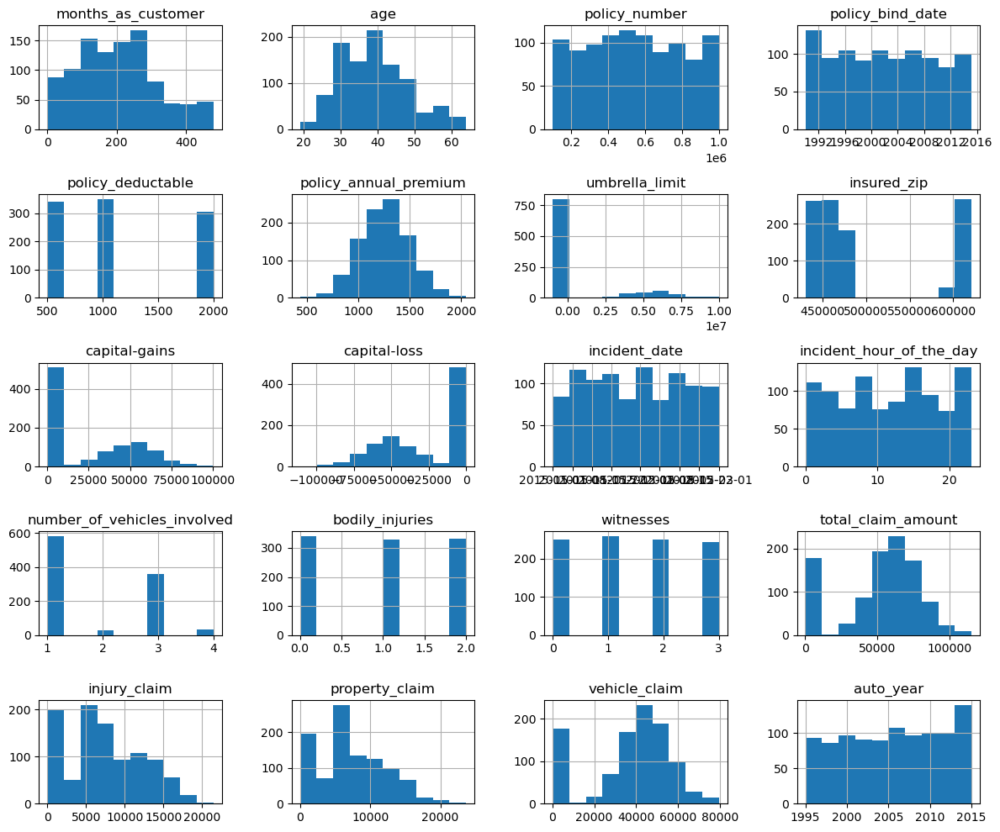

In [13]:
data.hist(figsize=(12, 10))
plt.tight_layout()
plt.show()

Visualisation des relations entre variables :

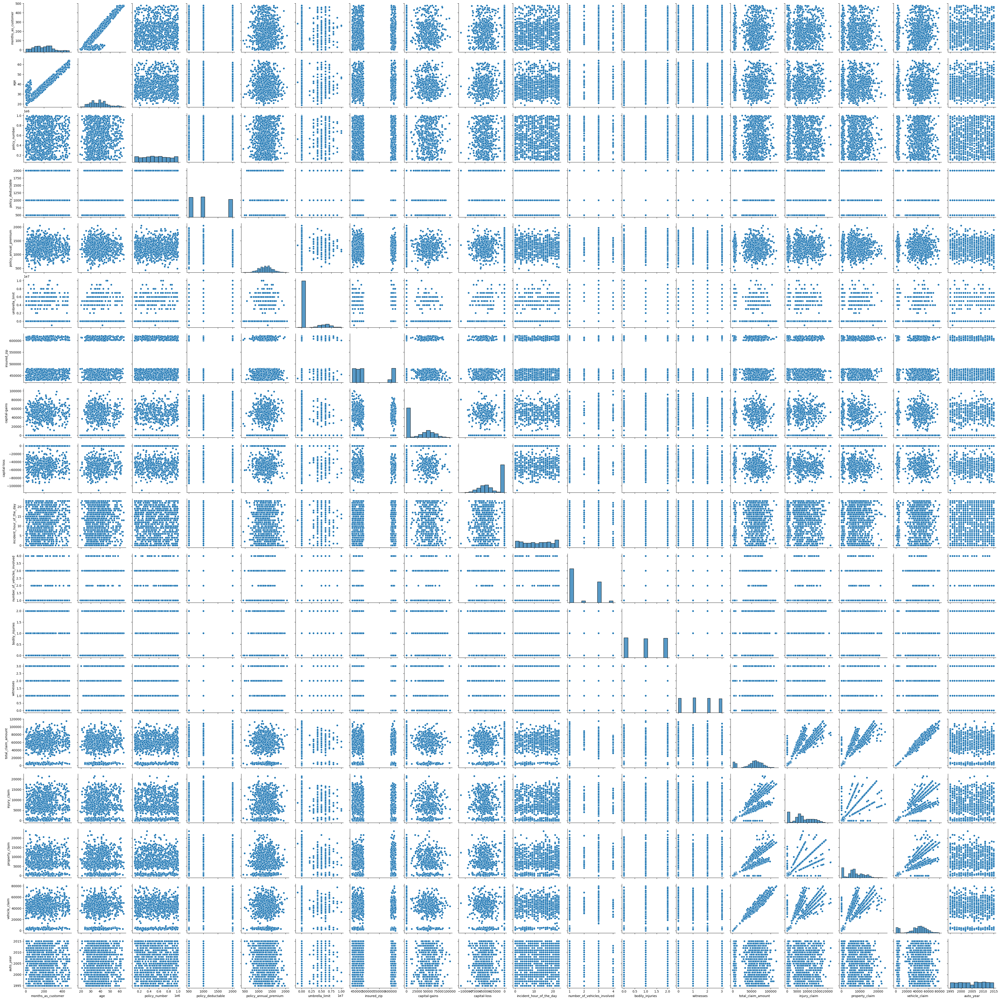

In [14]:
# Visualiser les relations entre variables continues avec un scatter plot
sns.pairplot(data)
plt.show()



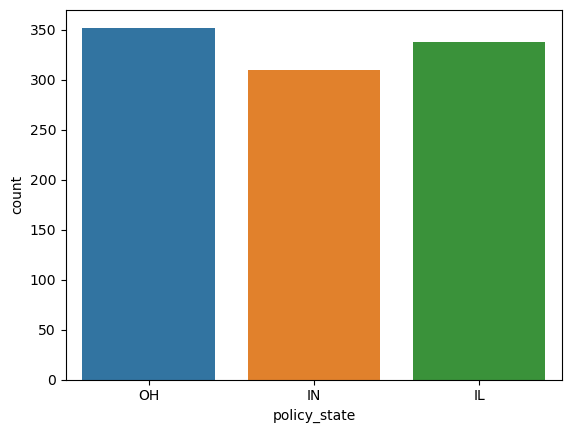

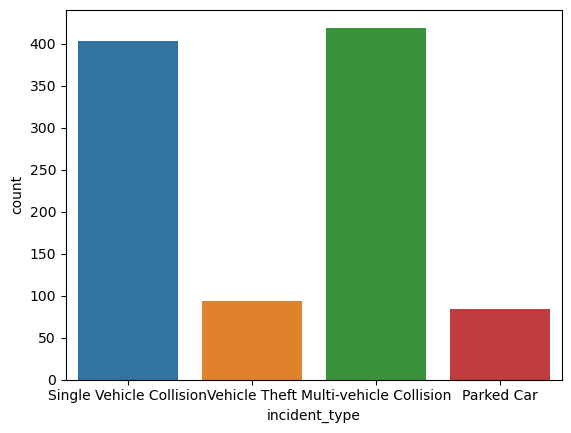

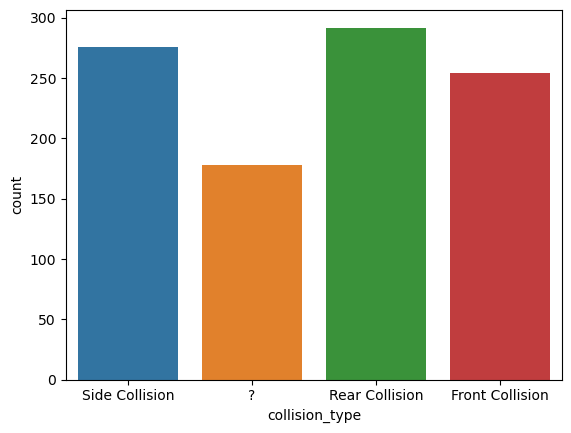

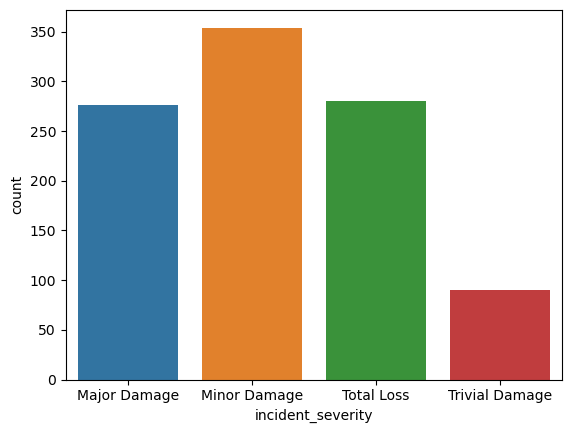

In [15]:
# Visualiser les variables catégorielles avec des graphiques à barres
categorical_vars = ['policy_state', 'incident_type', 'collision_type', 'incident_severity']
for var in categorical_vars:
    sns.countplot(x=var, data=data)
    plt.show()

In [52]:
data = data.replace({'umbrella_limit': '-1000000'}, '1000000') 



 ce code prend les données catégorielles d'un DataFrame, les transforme en un format plus facile à analyser, puis compte le nombre d'occurrences de chaque valeur catégorielle dans chaque colonne, et trie les résultats par nom de colonne et par fréquence croissante.
 La méthode .melt() est utilisée pour transformer le DataFrame en un format "long", ce qui signifie que chaque observation est représentée par une ligne unique. Dans ce cas, les noms de colonnes (var_name) deviennent une colonne dans le DataFrame résultant, tandis que les valeurs associées à ces colonnes sont placées dans une autre colonne appelée 'index'. Cette transformation est utile pour l'analyse exploratoire des données.

In [86]:
## Check categorical data
pd.set_option('display.max_rows', None)

pd.DataFrame(
        data[data.select_dtypes('object').columns.to_list()]
        .melt(var_name='columns', value_name='index')\
        .value_counts())\
        .sort_values(by=['columns',0])

0
columns                 index                        
authorities_contacted   None                       91
                        Ambulance                 196
                        Other                     198
                        Fire                      223
                        Police                    292
auto_make               Honda                      55
                        Mercedes                   65
                        Jeep                       67
                        Volkswagen                 68
                        Accura                     68
                        Audi                       69
                        Toyota                     70
                        BMW                        72
                        Ford                       72
                        Chevrolet                  76
                        Nissan                     78
                        Dodge                      80
                        Suburu                     80
                        Saab                       80
auto_model              RSX                        12
                        Accord                     13
                        M5                         15
                        X6                         16
                        C300                       18
                        3 Series                   18
                        Corolla                    20
                        CRV                        20
                        TL                         20
                        ML350                      20
                        Impreza                    20
                        Fusion                     21
                        Civic                      22
                        Highlander                 22
                        Silverado                  22
                        X5                         23
                        Ultima                     23
                        Maxima                     24
                        Escape                     24
                        Tahoe                      24
                        93                         25
                        Grand Cherokee             25
                        95                         27
                        F150                       27
                        E400                       27
                        Camry                      28
                        92x                        28
                        Forrestor                  28
                        Malibu                     30
                        Pathfinder                 31
                        Legacy                     32
                        A5                         32
                        Passat                     33
                        Jetta                      35
                        MDX                        36
                        A3                         37
                        Neon                       37
                        Wrangler                   42
                        RAM                        43
collision_type          ?                         178
                        Front Collision           254
                        Side Collision            276
                        Rear Collision            292
incident_city           Northbrook                122
                        Riverwood                 134
                        Hillsdale                 141
                        Northbend                 145
                        Columbus                  149
                        Arlington                 152
                        Springfield               157
incident_location       7155 Apache Drive           1
                        7178 Best Drive             1
                        7168 Andromedia Ridge       1
                        7162 Maple Ave              1
  

In [87]:
data['incident_location'].nunique()

1000

puisque la colonne incident_location a autant de valeurs uniques que le nombre total de lignes, cela signifie que chaque ligne a une valeur différente dans cette colonne. Donc la colonne "incident_location" n'apporte  pas beaucoup d'information discriminante et pourrait ne pas être très utile pour cette analyse. 

In [110]:
data.drop(columns=['incident_location'], inplace=True)


In [111]:
data.shape

(1000, 37)

In [112]:
data.drop(columns=['insured_relationship'], inplace=True)
data.drop(columns=['insured_education_level'], inplace=True)

In [113]:
data.dtypes

months_as_customer                      int64
age                                     int64
policy_number                           int64
policy_bind_date               datetime64[ns]
policy_state                           object
policy_csl                             object
policy_deductable                       int64
policy_annual_premium                 float64
umbrella_limit                          int64
insured_zip                             int64
insured_sex                            object
insured_occupation                     object
insured_hobbies                        object
capital-gains                           int64
capital-loss                            int64
incident_date                  datetime64[ns]
incident_type                          object
collision_type                         object
incident_severity                      object
authorities_contacted                  object
incident_state                         object
incident_city                     


Nous utiliserons un graphique KDE (Kernel Density Estimate) en utilisant klib.dist_plot pour permettre une meilleure compréhension de la distribution des caractéristiques numériques, en donnant la moyenne, la médiane et l'écart-type.

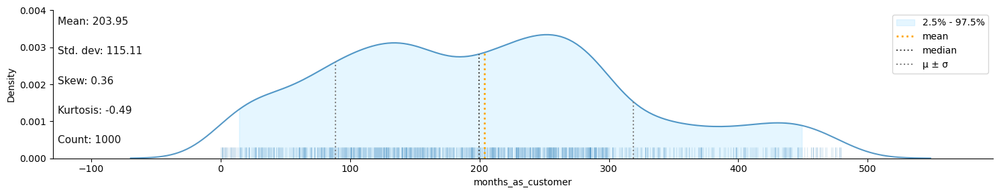

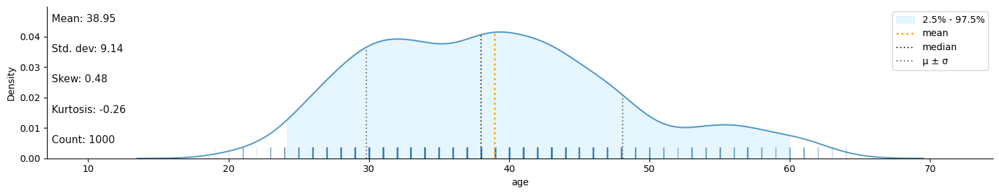

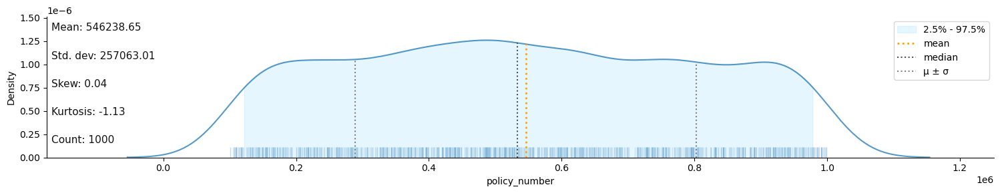

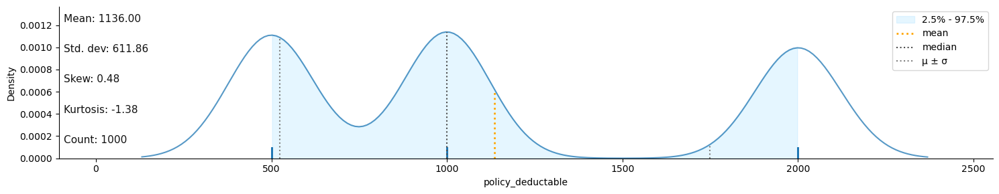

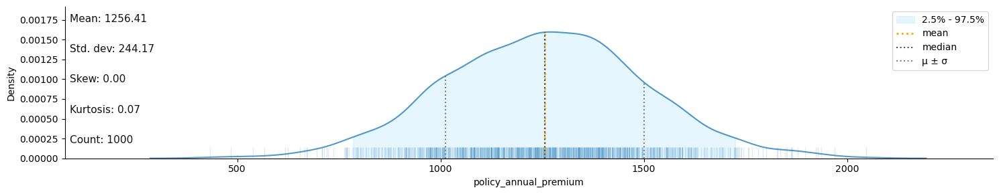

...

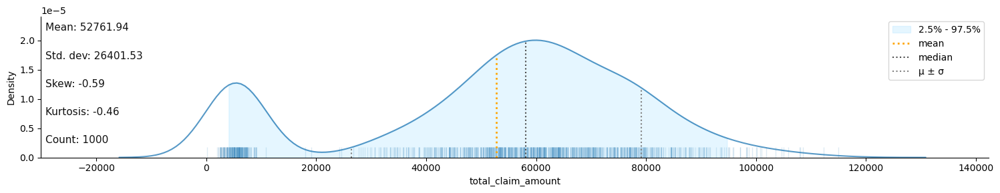

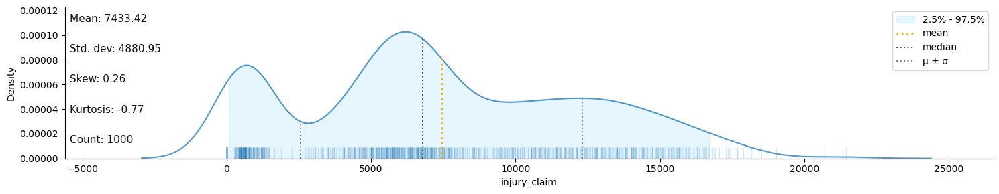

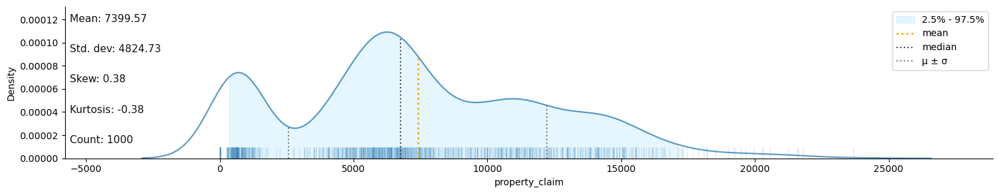

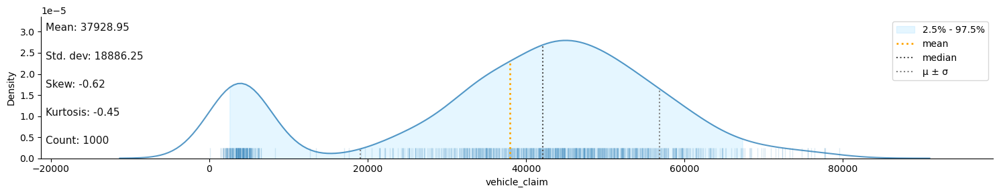

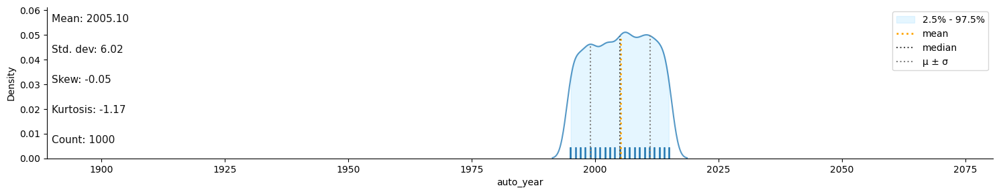

In [59]:


# Obtenez la liste des colonnes numériques
numeric_columns = data.select_dtypes(include=['int64', 'float64']).columns

# Générer des graphiques de distribution pour chaque colonne numérique
for column in numeric_columns:
    klib.dist_plot(data[column])


On souhaite inspecter rapidement les valeurs numeriques moyennes en fonction de regroupement categoriques pour les colonnes avec un petit nombre de categories uniques 

In [92]:
list_cat_col1 = []

for col in data.columns:
    if (data[col].dtype =='object'):
        list_cat_col1.append(col)

list_num_col = []

for col in data.columns:
    if (data[col].dtype =='int64'):
        list_num_col.append(col)

In [93]:
for col in list_cat_col:
    if data[col].nunique() <= 5:
        display(data.groupby(col)[list_num_col].mean().style.background_gradient(cmap='Blues'))

,months_as_customer,age,policy_number,policy_deductable,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year
policy_state,,,,,,,,,,,,,,,,,
IL,203.269231,39.224852,515796.857988,1147.928994,1201183.431953,499277.431953,22481.656805,-24788.757396,11.497041,1.908284,1.008876,1.449704,52844.171598,7658.668639,7398.579882,37786.923077,2004.807692
IN,205.548387,38.700000,562497.506452,1093.548387,1064516.129032,503753.364516,25328.387097,-28882.580645,11.416129,1.803226,0.925806,1.500000,53006.967742,7547.258065,7293.129032,38166.580645,2005.712903
OH,203.207386,38.900568,561150.803977,1161.931818,1036931.818182,500838.559659,27487.215909,-26879.261364,11.985795,1.803977,1.034091,1.511364,52467.187500,7116.875000,7494.261364,37856.051136,2004.849432


,months_as_customer,age,policy_number,policy_deductable,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year
policy_csl,,,,,,,,,,,,,,,,,
100/300,207.908309,39.091691,521871.042980,1134.670487,997134.670487,500158.034384,24866.475645,-25474.498567,11.636103,1.865330,1.002865,1.375358,55265.702006,7994.985673,7763.782235,39506.934097,2005.252149
250/500,203.159544,38.980057,571789.085470,1133.903134,1193732.193732,502185.937322,25307.407407,-27189.743590,11.689459,1.831909,0.971510,1.527066,51153.732194,7197.578348,7141.680912,36814.472934,2005.262108
500/1000,200.283333,38.743333,544692.283333,1140.000000,1113333.333333,501306.900000,25216.000000,-27865.000000,11.600000,1.816667,1.003333,1.570000,51730.833333,7056.066667,7277.600000,37397.166667,2004.743333


,months_as_customer,age,policy_number,policy_deductable,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year
insured_sex,,,,,,,,,,,,,,,,,
FEMALE,197.445065,38.325885,545149.752328,1141.527002,1078212.290503,503672.815642,25656.238361,-26227.560521,11.519553,1.821229,1.007449,1.443203,53343.314711,7429.236499,7466.145251,38447.932961,2005.260708
MALE,211.503240,39.669546,547501.578834,1129.589633,1127429.805616,498363.252700,24511.231102,-27450.323974,11.788337,1.859611,0.974082,1.537797,52087.645788,7438.272138,7322.354212,37327.019438,2004.920086


,months_as_customer,age,policy_number,policy_deductable,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year
incident_type,,,,,,,,,,,,,,,,,
Multi-vehicle Collision,206.510740,39.171838,553801.443914,1176.610979,1057279.236277,502551.042959,26713.842482,-27409.785203,12.785203,3.002387,1.019093,1.482100,61637.016706,8783.579952,8696.062053,44157.374702,2005.458234
Parked Car,192.416667,38.380952,514673.738095,1077.380952,1321428.571429,507201.761905,23309.523810,-27221.428571,7.869048,1.000000,0.892857,1.583333,5308.214286,740.952381,760.714286,3806.547619,2005.785714
Single Vehicle Collision,206.151365,39.114144,534607.471464,1096.774194,1047146.401985,496633.399504,24357.568238,-26660.297767,12.143921,1.000000,0.970223,1.483871,64445.459057,8978.511166,8987.047146,46479.900744,2004.568238
Vehicle Theft,193.446809,37.744681,590600.404255,1175.531915,1329787.234043,509546.734043,22967.021277,-24237.234043,7.787234,1.000000,1.053191,1.436170,5517.234043,771.489362,747.234043,3998.510638,2005.202128


,months_as_customer,age,policy_number,policy_deductable,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year
collision_type,,,,,,,,,,,,,,,,,
?,192.960674,38.044944,554769.842697,1129.213483,1325842.696629,508440.117978,23128.651685,-25645.505618,7.825843,1.000000,0.977528,1.505618,5418.595506,757.078652,753.595506,3907.921348,2005.477528
Front Collision,221.484252,40.519685,546310.688976,1194.881890,1043307.086614,501725.464567,26961.417323,-29118.503937,12.232283,1.893701,1.015748,1.586614,64658.267717,9126.023622,9057.047244,46475.196850,2005.027559
Rear Collision,201.027397,38.486301,543050.212329,1119.863014,1006849.315068,498935.880137,23579.109589,-26353.767123,12.184932,2.054795,0.996575,1.431507,61705.000000,8862.465753,8613.527397,44229.006849,2005.023973
Side Collision,198.007246,38.572464,544043.619565,1103.260870,1108695.652174,498494.934783,26361.956522,-25860.144928,12.992754,2.101449,0.974638,1.442029,62885.398551,8669.601449,8876.050725,45339.746377,2005.014493


,months_as_customer,age,policy_number,policy_deductable,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year
incident_severity,,,,,,,,,,,,,,,,,
Major Damage,208.605072,39.394928,549380.894928,1141.304348,1007246.376812,503550.554348,24292.028986,-25259.782609,12.242754,2.054348,1.025362,1.568841,64067.173913,8893.659420,9222.934783,45950.579710,2005.242754
Minor Damage,209.601695,39.262712,553237.601695,1141.242938,1225988.700565,503739.983051,26306.497175,-26862.429379,11.073446,1.745763,0.985876,1.409605,48642.683616,7030.056497,6717.231638,34895.395480,2005.129944
Total Loss,198.914286,38.621429,532796.339286,1139.285714,989285.714286,493655.060714,25859.642857,-29398.928571,12.992857,2.014286,0.960714,1.482143,62081.214286,8667.821429,8615.821429,44797.571429,2005.017857
Trivial Damage,183.155556,37.355556,550893.722222,1088.888889,1244444.444444,507635.155556,20758.888889,-23122.222222,7.855556,1.000000,1.011111,1.555556,5301.666667,701.555556,707.888889,3892.222222,2004.833333


,months_as_customer,age,policy_number,policy_deductable,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year
authorities_contacted,,,,,,,,,,,,,,,,,
Ambulance,197.826531,38.591837,512845.714286,1168.367347,1030612.244898,503695.959184,27234.183673,-28711.224490,12.178571,2.025510,0.933673,1.464286,61136.734694,8566.683673,8752.091837,43817.959184,2004.734694
Fire,211.237668,39.282511,578697.219731,1096.412556,955156.950673,500560.511211,24729.596413,-25983.408072,12.959641,1.991031,1.008969,1.502242,62501.345291,9006.547085,8404.977578,45089.820628,2004.582960
None,193.230769,38.021978,547817.109890,1181.318681,1230769.230769,507382.153846,28147.252747,-25495.604396,7.461538,1.000000,0.890110,1.538462,5357.032967,766.043956,753.516484,3837.472527,2004.879121
Other,204.545455,38.989899,530446.631313,1103.535354,1237373.737374,497655.853535,25014.141414,-28605.050505,12.202020,2.000000,0.994949,1.510101,64827.626263,9110.808081,9187.222222,46529.595960,2005.151515
Police,205.445205,39.191781,554080.883562,1152.397260,1126712.328767,500539.215753,23148.287671,-25301.712329,11.205479,1.750000,1.047945,1.458904,46294.452055,6411.780822,6582.910959,33299.760274,2005.784247


,months_as_customer,age,policy_number,policy_deductable,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year
property_damage,,,,,,,,,,,,,,,,,
?,202.933333,38.938889,536481.011111,1125.000000,1172222.222222,493646.500000,23601.944444,-26517.777778,11.111111,1.838889,1.000000,1.533333,52094.638889,7251.083333,7300.666667,37542.888889,2005.411111
NO,204.183432,39.000000,563584.772189,1134.615385,1263313.609467,506952.215976,26772.781065,-27735.502959,11.603550,1.857988,0.979290,1.467456,51300.591716,7303.668639,7208.757396,36788.165680,2005.082840
YES,204.913907,38.900662,538456.394040,1150.662252,834437.086093,503814.235099,25100.000000,-26068.543046,12.324503,1.817881,0.996689,1.453642,55192.947020,7795.993377,7731.026490,39665.927152,2004.758278


,months_as_customer,age,policy_number,policy_deductable,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year
police_report_available,,,,,,,,,,,,,,,,,
?,195.711370,38.379009,537653.370262,1123.906706,1265306.122449,505148.688047,25443.440233,-26480.174927,11.355685,1.862974,0.979592,1.437318,54428.104956,7784.198251,7590.991254,39052.915452,2005.119534
NO,215.644315,39.769679,543980.559767,1116.618076,1075801.749271,496325.953353,25296.501458,-25615.160350,11.551020,1.825073,0.991254,1.463557,49807.317784,6896.413994,7127.084548,35783.819242,2005.268222
YES,200.187898,38.671975,558083.471338,1170.382166,949044.585987,502256.961783,24593.312102,-28423.566879,12.060510,1.828025,1.006369,1.566879,54169.394904,7636.847134,7488.121019,39044.426752,2004.904459


In [114]:
data.dtypes

months_as_customer                      int64
age                                     int64
policy_number                           int64
policy_bind_date               datetime64[ns]
policy_state                           object
policy_csl                             object
policy_deductable                       int64
policy_annual_premium                 float64
umbrella_limit                          int64
insured_zip                             int64
insured_sex                            object
insured_occupation                     object
insured_hobbies                        object
capital-gains                           int64
capital-loss                            int64
incident_date                  datetime64[ns]
incident_type                          object
collision_type                         object
incident_severity                      object
authorities_contacted                  object
incident_state                         object
incident_city                     

# Gestion des valeurs manquantes

In [115]:
#remplacer toute ? en nan
for column in data.columns:
    if data[column].apply(lambda x: x == '?').any():
        data[column] = data[column].replace("?", np.nan)


In [116]:
data.isna().sum()

months_as_customer               0
age                              0
policy_number                    0
policy_bind_date                 0
policy_state                     0
policy_csl                       0
policy_deductable                0
policy_annual_premium            0
umbrella_limit                   0
insured_zip                      0
insured_sex                      0
insured_occupation               0
insured_hobbies                  0
capital-gains                    0
capital-loss                     0
incident_date                    0
incident_type                    0
collision_type                 178
incident_severity                0
authorities_contacted            0
incident_state                   0
incident_city                    0
incident_hour_of_the_day         0
number_of_vehicles_involved      0
property_damage                360
bodily_injuries                  0
witnesses                        0
police_report_available        343
total_claim_amount  

on a des valeurs manquantes juste pour les colonnes collision_type , property_damage ,police_report_available qui sont des valeurs categoriques 

Donc pour gerer les valeurs manquantes on peut soit les supprimer ou les remplacer par la categorie la plus fréquente dans la colonne .Cela peut être fait en utilisant la classe SimpleImputer de scikit-learn avec la stratégie "most_frequent".


In [117]:
from sklearn.impute import SimpleImputer

# Créez un imputeur avec la stratégie 'most_frequent'
imputer = SimpleImputer(strategy='most_frequent')

# Sélectionnez uniquement les colonnes binaires
colonnes_binaires = ['police_report_available', 'property_damage', 'collision_type']  # Remplacez ceci par les noms de vos colonnes binaires

# Ajustez et transformez les données binaires uniquement
data[colonnes_binaires] = imputer.fit_transform(data[colonnes_binaires])


In [118]:
data.isna().sum()


months_as_customer             0
age                            0
policy_number                  0
policy_bind_date               0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_zip                    0
insured_sex                    0
insured_occupation             0
insured_hobbies                0
capital-gains                  0
capital-loss                   0
incident_date                  0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_report_available        0
total_claim_amount             0
injury_claim                   0
property_c

# les variables catégorielles en variables numériques

In [120]:
data['property_damage'] = data['property_damage'].map({'YES': 1, 'NO': 0})

In [121]:
data['police_report_available'] = data['police_report_available'].map({'YES': 1, 'NO': 0})

In [122]:
data['insured_sex'] = data['insured_sex'].map({'FEMALE': 1, 'MALE': 2})

In [123]:
data['policy_state'] = data['policy_state'].map({'OH': 1, 'IN': 2 , 'IL' : 3})

# Gestion des valeurs aberrantes

diviser notre bases de donnees en colonnes numeriques et colonnes categoriques 

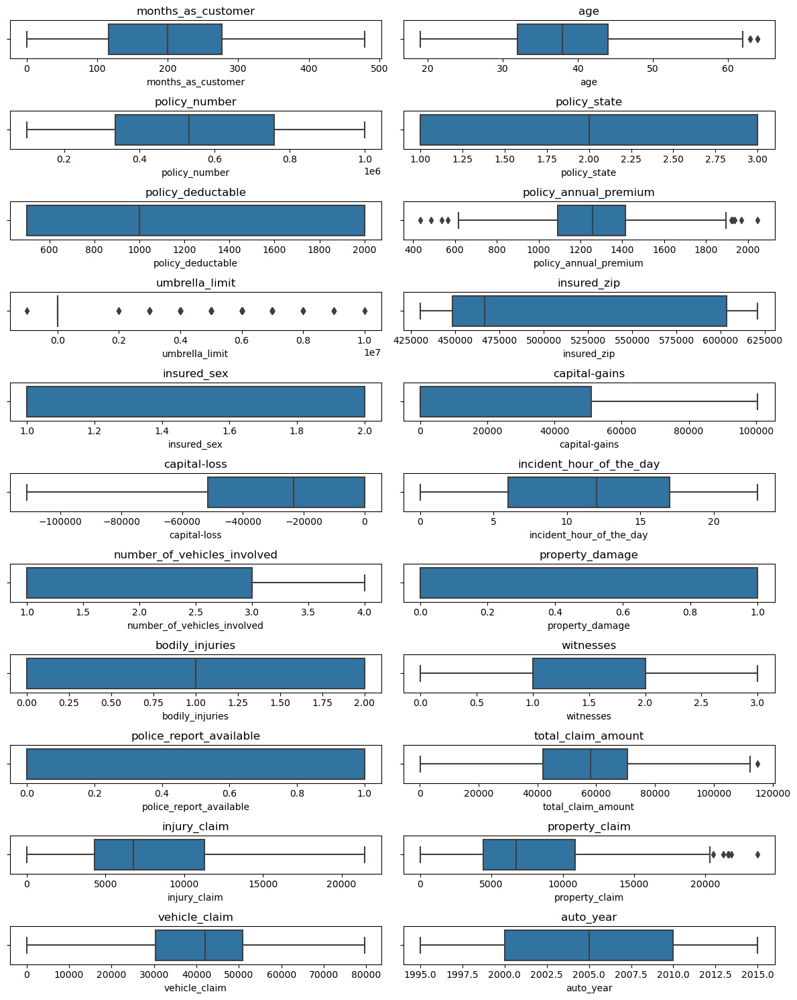

In [127]:
import seaborn as sns
import matplotlib.pyplot as plt

# Supposons que 'data' est votre DataFrame contenant les données
numeric_columns = data.select_dtypes(include=['int64', 'float64']).columns

# Calculate the number of rows and columns for the subplot grid
num_cols = len(numeric_columns)
num_rows = (num_cols + 1) // 2  # Add 1 to handle odd number of columns

# Create subplots
fig, axs = plt.subplots(num_rows, 2, figsize=(12, 15))

# Itérer sur chaque colonne numérique
for i, column in enumerate(numeric_columns):
    # Calculate the row and column index for the current subplot
    row = i // 2
    col = i % 2

    # Créer un graphique de boîte pour la colonne actuelle
    sns.boxplot(x=data[column], ax=axs[row, col])
    axs[row, col].set_title(column)  # Définir le titre de chaque sous-tracé

# Supprimer les sous-tracés vides s'il y en a
for i in range(num_cols, num_rows * 2):
    fig.delaxes(axs.flatten()[i])

plt.tight_layout()
plt.show()


En utilisant sns.boxplot qui affiche le résumé des cinq nombres d'une caractéristique numérique. Les cinq nombres sont le minimum, le premier quartile (Q1 ou marque 25%), la médiane (Q2), le troisième quartile (Q3 ou marque 75%), et le maximum.

In [128]:
def remove_outlier(set_data, numeric_columns):
    list_of_set_data = []

    for col in numeric_columns:
        q1 = set_data[col].quantile(0.25)
        q3 = set_data[col].quantile(0.75)
        iqr = q3 - q1

        # Filtrer les valeurs aberrantes en dehors de la plage [Q1 - 1.5*IQR, Q3 + 1.5*IQR]
        set_data_cleaned = set_data[~((set_data[col] < (q1 - 1.5 * iqr)) | (set_data[col] > (q3 + 1.5 * iqr)))].copy()
        list_of_set_data.append(set_data_cleaned.copy())

    # Concaténer les données nettoyées
    set_data_cleaned = pd.concat(list_of_set_data)


    return set_data_cleaned


In [129]:

data3 = remove_outlier(data,numeric_columns)

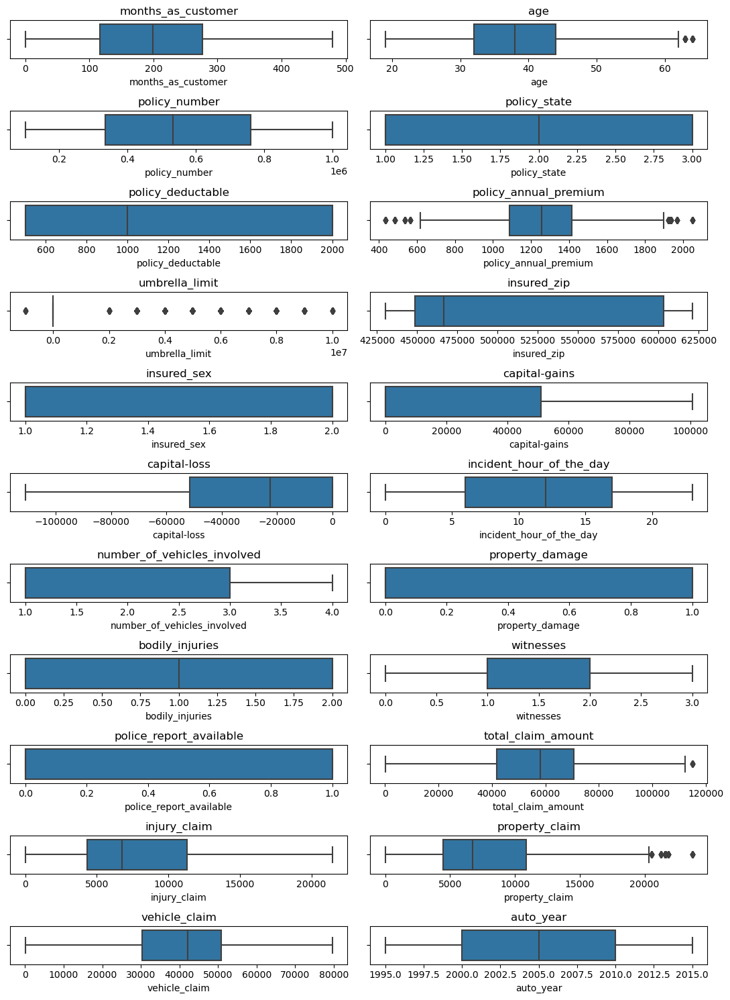

In [130]:
import seaborn as sns
import matplotlib.pyplot as plt

# Supposons que 'data' est votre DataFrame contenant les données
numeric_columns = data3.select_dtypes(include=['int64', 'float64']).columns

# Calculate the number of rows and columns for the subplot grid
num_cols = len(numeric_columns)
num_rows = (num_cols + 1) // 2  # Add 1 to handle odd number of columns

# Create subplots
fig, axs = plt.subplots(num_rows, 2, figsize=(11, 15))

# Itérer sur chaque colonne numérique
for i, column in enumerate(numeric_columns):
    # Calculate the row and column index for the current subplot
    row = i // 2
    col = i % 2

    # Créer un graphique de boîte pour la colonne actuelle
    sns.boxplot(x=data3[column], ax=axs[row, col])
    axs[row, col].set_title(column)  # Définir le titre de chaque sous-tracé

# Supprimer les sous-tracés vides s'il y en a
for i in range(num_cols, num_rows * 2):
    fig.delaxes(axs.flatten()[i])

plt.tight_layout()
plt.show()


# Selection des caractéristiques

In [ ]:
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt



# Séparer les variables numériques
numeric_data = data.select_dtypes(include=[np.number])

# Standardisation des données
scaler = StandardScaler()
scaled_data = scaler.fit_transform(numeric_data)

# Appliquer PCA
pca = PCA()
pca.fit(scaled_data)

# Analyser la variance expliquée
explained_variance = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance)

# Tracer le graphique de la variance expliquée
plt.plot(range(1, len(explained_variance) + 1), cumulative_variance, marker='o', linestyle='-')
plt.xlabel('Nombre de composantes principales')
plt.ylabel('Variance expliquée cumulative')
plt.title('Variance expliquée cumulative par nombre de composantes principales')
plt.show()

# Identifier le nombre de composantes à conserver
desired_variance = 0.95  # Vous pouvez ajuster ce seuil selon vos besoins
num_components = np.argmax(cumulative_variance >= desired_variance) + 1
print("Nombre de composantes principales pour expliquer {}% de la variance : {}".format(desired_variance * 100, num_components))

# Sélectionner les composantes principales
selected_components = pca.components_[:num_components]

# Récupérer les noms des features
feature_names = numeric_data.columns

# Afficher les features sélectionnées
selected_features = [feature_names[i] for i in range(len(feature_names)) if selected_components[:, i].any()]
print("Features sélectionnées :", selected_features)



 <p style="font-family: Arial; font-size:2.10em;color:blue; font-style:bold"><br>
 corrélation entre les variables numeriques </p><br>

In [131]:
numeric_columns_ = data3.select_dtypes(include=['int64', 'float64']).columns


In [132]:
# Séparer les variables numériques
numeric_data = data.select_dtypes(include=['int64', 'float64'])
numeric_data

,months_as_customer,age,policy_number,policy_state,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,capital-gains,...,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year
0,328,48,521585,1,1000,1406.91,0,466132,2,53300,...,1,1,1,2,1,71610,6510,13020,52080,2004
1,228,42,342868,2,2000,1197.22,5000000,468176,2,0,...,1,0,0,0,0,5070,780,780,3510,2007
2,134,29,687698,1,2000,1413.14,5000000,430632,1,35100,...,3,0,2,3,0,34650,7700,3850,23100,2007
3,256,41,227811,3,2000,1415.74,6000000,608117,1,48900,...,1,0,1,2,0,63400,6340,6340,50720,2014
4,228,44,367455,3,1000,1583.91,6000000,610706,2,66000,...,1,0,0,1,0,6500,1300,650,4550,2009
5,256,39,104594,1,1000,1351.10,0,478456,1,0,...,3,0,0,2,0,64100,6410,6410,51280,2003
6,137,34,413978,2,1000,1333.35,0,441716,2,0,...,3,0,0,0,0,78650,21450,7150,50050,2012
7,165,37,429027,3,1000,1137.03,0,603195,2,0,...,3,0,2,2,1,51590,9380,9380,32830,2015
8,27,33,485665,3,500,1442.99,0,601734,1,0,...,1,0,1,1,1,27700,2770,2770,22160,2012
9,212,42,636550,3,500,1315.68,0,600983,2,0,...,1,0,2,1,0,42300,4700,4700,32900,1996


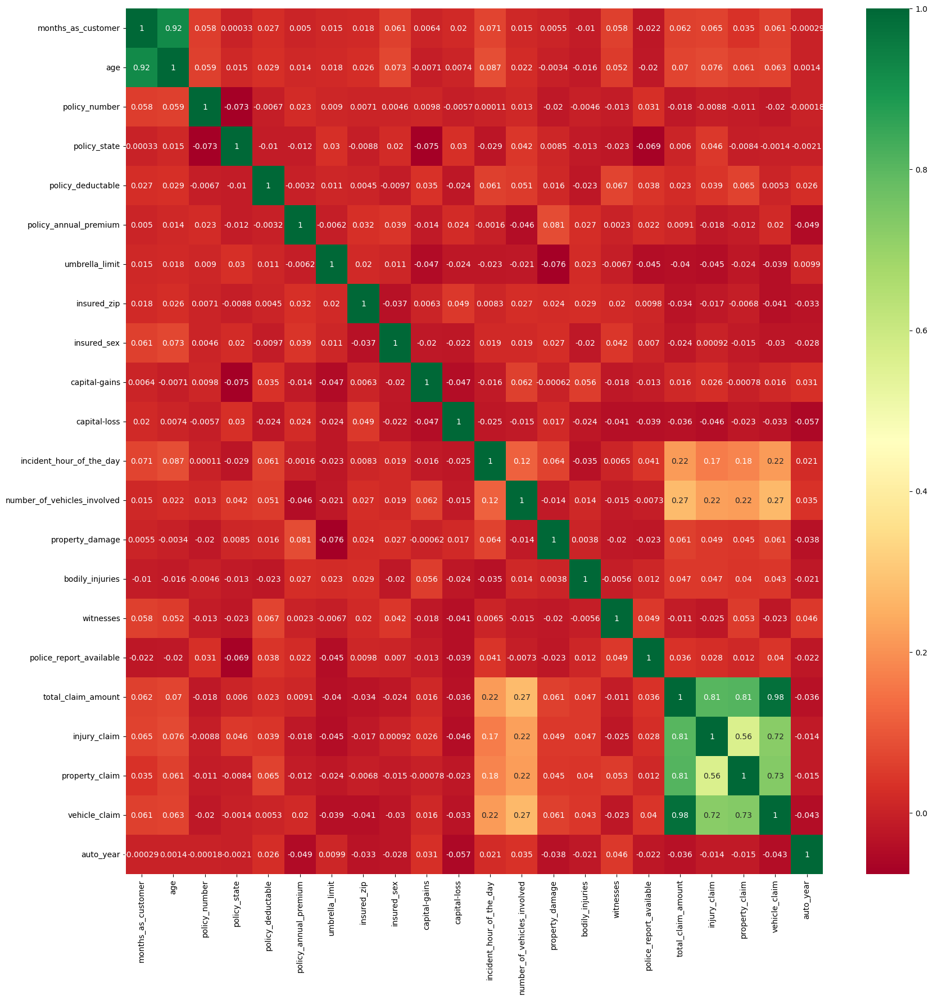

In [133]:

#get correlations of each features in dataset
corrmat = numeric_data.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
#plot heat map
g=sns.heatmap(numeric_data[top_corr_features].corr(),annot=True,cmap="RdYlGn")

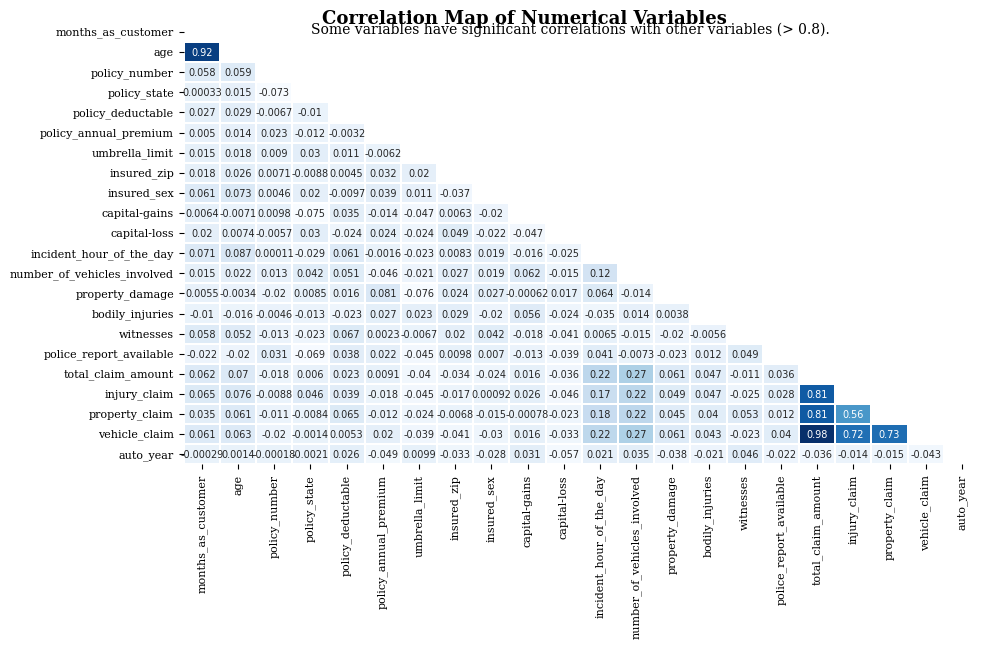

In [134]:
train_corr = numeric_data.copy()



# -- Create Figure -- #
fig, ax = plt.subplots(figsize=(10,7))



# --- Create Mask --- #
mask = np.triu(np.ones_like(corrmat, dtype=bool))

# --- Cretea heatmap --- #
sns.heatmap(corrmat, annot=True, mask=mask, cmap='Blues', linewidths=0.1, cbar=False, annot_kws={"size":7})

# --- Figuration Setting --- #
yticks, ylabels = plt.yticks()
xticks, xlabels = plt.xticks()
ax.set_xticklabels(xlabels, size=8, fontfamily='serif')
ax.set_yticklabels(ylabels, size=8, fontfamily='serif')
plt.suptitle('Correlation Map of Numerical Variables', fontweight='heavy', x=0.327, y=0.96, ha='left', fontsize=13, fontfamily='serif')
plt.title('Some variables have significant correlations with other variables (> 0.8).\n', fontsize=10, x=0.16, y=0.92, fontfamily='serif', loc='left')
plt.tight_layout(rect=[0, 0.04, 1, 1.01])

In [182]:
data3.drop(columns=['auto_year'], inplace=True)

creer une matrice de correlation et selectionner les paires de variables qui ont une correlation superieur a 0.8 . Ensuite , on transfoeme cette matrice en une dataframe en elimineat les redondances pour obtenir les paires de variables correlées.
=> ce code identifie les paires de variables fortement corrélées avec une correlation sup a 0.8

In [135]:
import copy

# Create threshold of 0.8 correlation
corr_multi = corrmat[corrmat>=0.8].reset_index()

# melted to get the features with >= 0.8 value
melted_corr = pd.melt(copy.deepcopy(corr_multi), id_vars='index', var_name='column_name', value_name='correlation').sort_values(by=['correlation']).dropna()
melted_corr.columns = ['row_name', 'column_name', 'correlation']

# Drop the features that correlated each other
melted_corr = melted_corr[melted_corr['row_name'] != melted_corr['column_name']].drop_duplicates(subset='correlation')

melted_corr

,row_name,column_name,correlation
413,total_claim_amount,injury_claim,0.805025
435,total_claim_amount,property_claim,0.810686
1,age,months_as_customer,0.922098
457,total_claim_amount,vehicle_claim,0.982773


total_claim_amount vs. injury_claim : Ces deux variables sont fortement corrélées avec une corrélation de 0.805025. Cela signifie qu'il y a une corrélation positive significative
total_claim_amount vs. property_claim : Ces deux variables sont également fortement corrélées avec une corrélation de 0.810686.
de meme pour les 2 autres paires 
Lorsque deux variables sont fortement corrélées elles fournissent essentiellement la meme information .

Pour réduire la multicolinéarité, nous pouvons soit supprimer total_claim_amount des données, puisque total_claim_amount = injury_claim + property_claim + vehicle_claim,

ou supprimer les trois autres (injury_claim, property_claim, vehicle_claim).



In [165]:
data3.drop(columns=['total_claim_amount'], inplace=True)

In [166]:
data3.drop(columns=['age'], inplace=True)


 <p style="font-family: Arial; font-size:1.80em;color:blue; font-style:bold"><br>
 Corréltion entre variables numeriques et variables categoriques</p><br>

In [167]:
categorical_data = data3.select_dtypes(include=['object'])

In [168]:
from scipy.stats import pointbiserialr
import pandas as pd

# Initialiser la liste des résultats de corrélation
correlation_results = []

# Boucle sur les colonnes numériques et catégoriques pour calculer la corrélation
for numeric_column in numeric_data.columns:
    for categorical_column in categorical_data_encoded.columns:
        correlation, p_value = pointbiserialr(numeric_data[numeric_column], categorical_data_encoded[categorical_column])
        correlation_results.append({
            'Variable numérique': numeric_column,
            'Variable catégorique': categorical_column,
            'Corrélation': correlation,
            'p-value': p_value
        })

# Créer un dataframe à partir des résultats de corrélation
correlation_df = pd.DataFrame(correlation_results)


In [169]:
correlation_df

,Variable numérique,Variable catégorique,Corrélation,p-value
0,months_as_customer,policy_csl_100/300,0.025164,4.266740e-01
1,months_as_customer,policy_csl_250/500,-0.005078,8.725811e-01
2,months_as_customer,policy_csl_500/1000,-0.020886,5.094404e-01
3,months_as_customer,insured_occupation_adm-clerical,0.004971,8.752512e-01
4,months_as_customer,insured_occupation_armed-forces,-0.022490,4.774663e-01
5,months_as_customer,insured_occupation_craft-repair,0.021728,4.925134e-01
6,months_as_customer,insured_occupation_exec-managerial,-0.003231,9.187267e-01
7,months_as_customer,insured_occupation_farming-fishing,-0.000293,9.926072e-01
8,months_as_customer,insured_occupation_handlers-cleaners,-0.000327,9.917477e-01
9,months_as_customer,insured_occupation_machine-op-inspct,-0.009388,7.668308e-01


Chaque ligne représente la corrélation entre une variable numérique et une variable catégorique spécifique, avec le coefficient de corrélation (corr) et la valeur p (p-value) associée à cette corrélation.

In [184]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder


# Sélection des caractéristiques numériques et catégorielles
numeric_features = data3.select_dtypes(include=['int64', 'float64']).columns.tolist()
categorical_features = data3.select_dtypes(include=['object']).columns.tolist()

# Prétraitement des caractéristiques catégorielles avec LabelEncoder
label_encoders = {}
for feature in categorical_features:
    # Conversion des valeurs catégorielles en chaînes de caractères
    data3[feature] = data3[feature].astype(str)
    # Utilisation de LabelEncoder
    label_encoders[feature] = LabelEncoder()
    data3[feature] = label_encoders[feature].fit_transform(data3[feature])

# Sélection des caractéristiques à utiliser
X = data3[numeric_features + categorical_features]


In [185]:
data3.dtypes

months_as_customer                      int64
policy_number                           int64
policy_bind_date               datetime64[ns]
policy_state                            int64
policy_csl                              int32
policy_deductable                       int64
policy_annual_premium                 float64
umbrella_limit                          int64
insured_zip                             int64
insured_sex                             int64
insured_occupation                      int32
insured_hobbies                         int32
capital-gains                           int64
capital-loss                            int64
incident_date                  datetime64[ns]
incident_type                           int32
collision_type                          int32
incident_severity                       int32
authorities_contacted                   int32
incident_state                          int32
incident_city                           int32
incident_hour_of_the_day          

# PCA

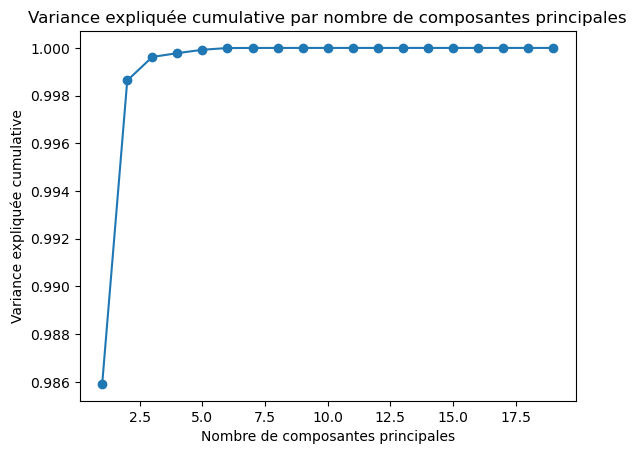

Nombre de composantes principales pour expliquer 95.0% de la variance : 1
Features sélectionnées : ['months_as_customer', 'policy_number', 'policy_state', 'policy_deductable', 'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex', 'capital-gains', 'capital-loss', 'incident_hour_of_the_day', 'number_of_vehicles_involved', 'property_damage', 'bodily_injuries', 'witnesses', 'police_report_available', 'injury_claim', 'property_claim', 'vehicle_claim']


In [186]:
# Appliquer PCA
pca = PCA()
pca.fit(X)

# Analyser la variance expliquée
explained_variance = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance)

# Tracer le graphique de la variance expliquée
plt.plot(range(1, len(explained_variance) + 1), cumulative_variance, marker='o', linestyle='-')
plt.xlabel('Nombre de composantes principales')
plt.ylabel('Variance expliquée cumulative')
plt.title('Variance expliquée cumulative par nombre de composantes principales')
plt.show()

# Identifier le nombre de composantes à conserver
desired_variance = 0.95  # Vous pouvez ajuster ce seuil selon vos besoins
num_components = np.argmax(cumulative_variance >= desired_variance) + 1
print("Nombre de composantes principales pour expliquer {}% de la variance : {}".format(desired_variance * 100, num_components))

# Sélectionner les composantes principales
selected_components = pca.components_[:num_components]

# Récupérer les noms des features
feature_names = X.columns

# Afficher les features sélectionnées
selected_features = [feature_names[i] for i in range(len(feature_names)) if selected_components[:, i].any()]
print("Features sélectionnées :", selected_features)

In [187]:
len(selected_features)


19

In [188]:
selected_features


['months_as_customer',
 'policy_number',
 'policy_state',
 'policy_deductable',
 'policy_annual_premium',
 'umbrella_limit',
 'insured_zip',
 'insured_sex',
 'capital-gains',
 'capital-loss',
 'incident_hour_of_the_day',
 'number_of_vehicles_involved',
 'property_damage',
 'bodily_injuries',
 'witnesses',
 'police_report_available',
 'injury_claim',
 'property_claim',
 'vehicle_claim']

In [196]:
from sklearn.feature_selection import VarianceThreshold

# Créez un objet VarianceThreshold
threshold = 0.1  # Définissez le seuil de variance
variance_selector = VarianceThreshold(threshold=threshold)

# Appliquez VarianceThreshold sur vos données
nouvelles_donnees = variance_selector.fit_transform(X)

# Obtenez les indices des fonctionnalités sélectionnées
indices_selectionnes = variance_selector.get_support(indices=True)

# Obtenez les noms des fonctionnalités sélectionnées à partir de vos données d'origine
fonctionnalites_selectionnees = X.columns[indices_selectionnes]

fonctionnalites_selectionnees




Index(['months_as_customer', 'policy_number', 'policy_state',
       'policy_deductable', 'policy_annual_premium', 'umbrella_limit',
       'insured_zip', 'insured_sex', 'capital-gains', 'capital-loss',
       'incident_hour_of_the_day', 'number_of_vehicles_involved',
       'property_damage', 'bodily_injuries', 'witnesses',
       'police_report_available', 'injury_claim', 'property_claim',
       'vehicle_claim'],
      dtype='object')

In [197]:
len(fonctionnalites_selectionnees)

19

In [205]:
X.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21778 entries, 0 to 999
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   months_as_customer       21778 non-null  int64  
 1   policy_deductable        21778 non-null  int64  
 2   policy_annual_premium    21778 non-null  float64
 3   insured_zip              21778 non-null  int64  
 4   insured_sex              21778 non-null  int64  
 5   capital-gains            21778 non-null  int64  
 6   capital-loss             21778 non-null  int64  
 7   property_damage          21778 non-null  int64  
 8   bodily_injuries          21778 non-null  int64  
 9   witnesses                21778 non-null  int64  
 10  police_report_available  21778 non-null  int64  
 11  injury_claim             21778 non-null  int64  
 12  property_claim           21778 non-null  int64  
 13  vehicle_claim            21778 non-null  int64  
 14  incident_type           

In [202]:
X = pd.concat([X, data3['incident_type']], axis=1)

In [203]:
X.drop(columns=['policy_state'], inplace=True)
X.drop(columns=['policy_number'], inplace=True)
X.drop(columns=['umbrella_limit'], inplace=True)

In [204]:
X.drop(columns=['incident_hour_of_the_day'], inplace=True)
X.drop(columns=['number_of_vehicles_involved'], inplace=True)

In [ ]:
X = pd.concat([X, data3['incident_state']], axis=1)
X = pd.concat([X, data3['incident_type']], axis=1)